In [1]:
%matplotlib notebook
import numpy as np
from numpy.fft import fft2, ifft2, fftshift
import matplotlib
from matplotlib import pyplot as plt
from matplotlib import cm
import scipy
from scipy.optimize import curve_fit
from scipy.ndimage import uniform_filter as uf

from skimage.filters import threshold_otsu, threshold_local, threshold_niblack
from skimage.transform import downscale_local_mean #For binning

import xarray as xr #package for labeling and adding metadata to multi-dimensional arrays   
import tifffile 

import pandas as pd
import io 
import sys
import csv
import os
import glob #glob is helpful for searching for filenames or directories
import pickle #for saving data
### usually this block prints out "nd2reader module not found. Reading of .nd2 files disabled." on the first run
### this is fine (unless you need to read .nd2 files), just re-run this block to make the error go away

import cv2 as cv

C:\Users\svc-scst291lab\AppData\Local\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


# Locate Data File

In [2]:
data_dir = "Z:\\Maya N\\"
file = glob.glob(data_dir+"EcoliGrowth.tif")
print('Tiff file: ', file)
tiff_file = tifffile.imread(file[0])

Tiff file:  ['Z:\\Maya N\\EcoliGrowth.tif']


# Display Images and Calculate Dark Pixels
Each block of code shows a raw frame from the tiff file. Then, local thresholding is performed based off the parameters set by `block_size` and `offset_val`. After thresholding, the image is binarized so all pixel values are either black or white, and the binarized image is displayed. Finally, the total number of dark pixels are calculated. A white pixel is denoted as 1 and black pixels are 0 so the total number of white pixels is the sum of pixel values. This sum is subtracted from the total number of pixels in the image to find the number of black pixels. The number of black pixels is the area of bacteria in units of pixels. Each block of code is repeated for every frame in the tiff file.

Tiff file info: (35, 686, 812)


<IPython.core.display.Javascript object>


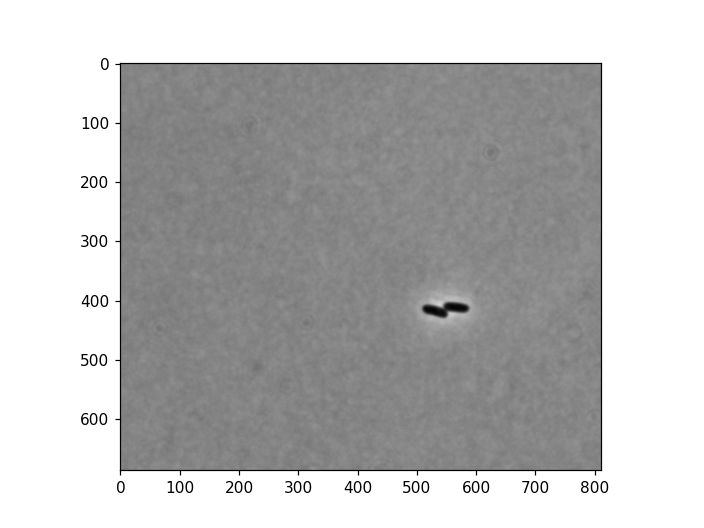

<IPython.core.display.Javascript object>


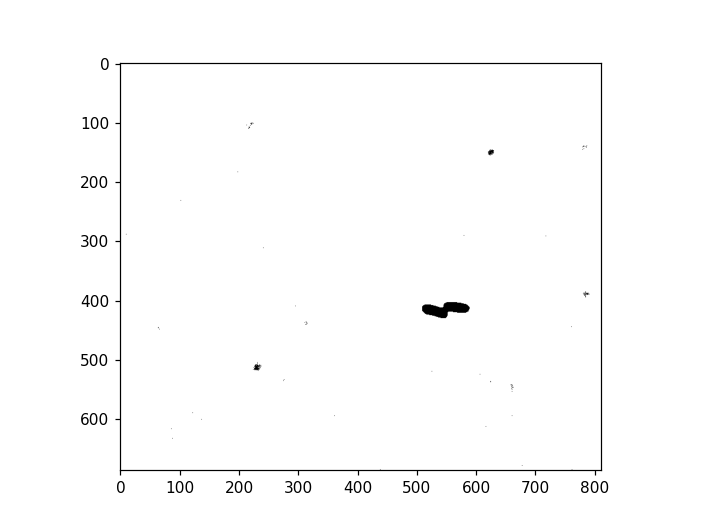

[1 1 1 ... 1 1 1]
dark pixels =  1582


In [3]:
frame_key = 0                                                     # Which frame of the tiff file will be read
image = tifffile.imread(file[0], key=[frame_key])                 # Reads tiff file and selects frame
print('Tiff file info: '+ str(tiff_file.shape))
fig, ax = plt.subplots()
ax.imshow(image, cmap="gray", vmin=0, vmax=255)                   # Show raw image in grayscale

block_size = 301                                                  # Threshold value used in threshold_local function
offset_val = 15                                                   # Value subtracted from block_size to get actual threshold value
thresh_im = threshold_local(image, block_size, offset= offset_val)# Thresholds image with given parameters
binary_im = 1*(image > thresh_im)                                 # Binarizes image so pixel values are either 0 or 1

fig, ax2 = plt.subplots()
ax2.imshow(binary_im, cmap="gray")                                # Show thresholded image in grayscale

rav_im = binary_im.ravel()                                        # Turns binarized image into a 1D array of pixel values
print(rav_im)
tot_pix = (len(rav_im))                                           # Calculates the total number of pixels in image
white_pix = np.sum(rav_im)                                        # Finds the area of white pixels in image
dark_pix0 = tot_pix - white_pix                                   # Finds area of black pixels in image
print('dark pixels = ', dark_pix0)

Tiff file info: (35, 686, 812)


<IPython.core.display.Javascript object>


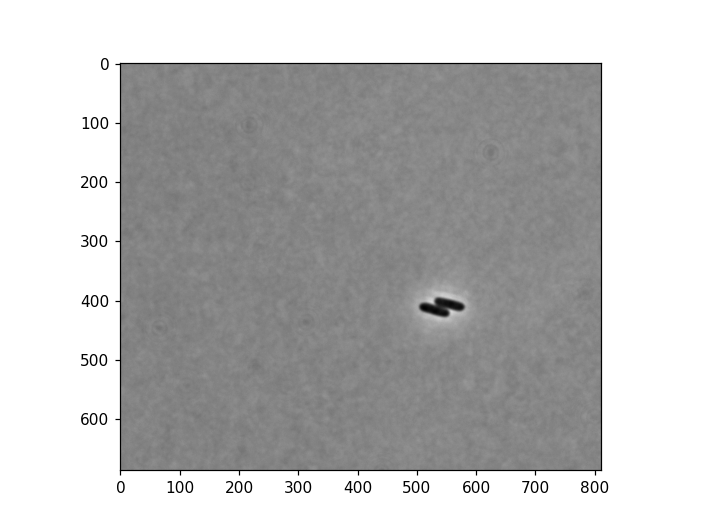

<IPython.core.display.Javascript object>


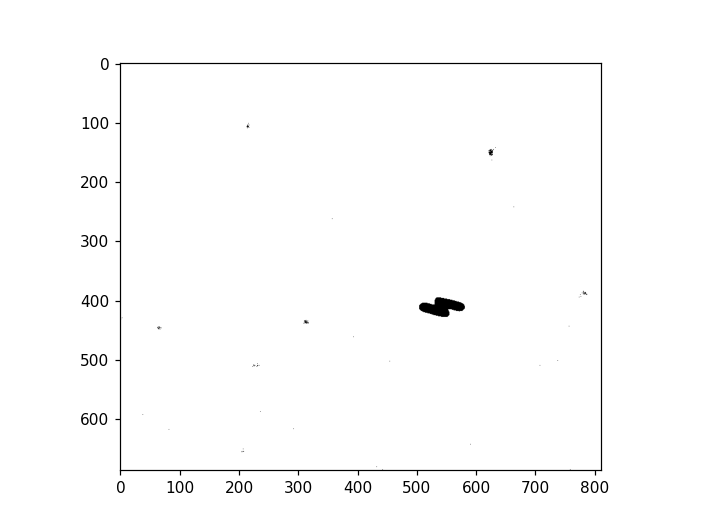

[1 1 1 ... 1 1 1]
dark pixels =  1718


In [4]:
frame_key = 1
image = tifffile.imread(file[0], key=[frame_key])
print('Tiff file info: '+ str(tiff_file.shape))
fig, ax = plt.subplots()
ax.imshow(image, cmap="gray", vmin=0, vmax=255)

block_size = 301
offset_val = 15
thresh_im = threshold_local(image, block_size, offset= offset_val)
binary_im = 1*(image > thresh_im)

fig, ax2 = plt.subplots()
ax2.imshow(binary_im, cmap="gray")

rav_im = binary_im.ravel()
print(rav_im)
tot_pix = (len(rav_im))
white_pix = np.sum(rav_im)
dark_pix1 = tot_pix - white_pix
print('dark pixels = ', dark_pix1)

Tiff file info: (35, 686, 812)


<IPython.core.display.Javascript object>


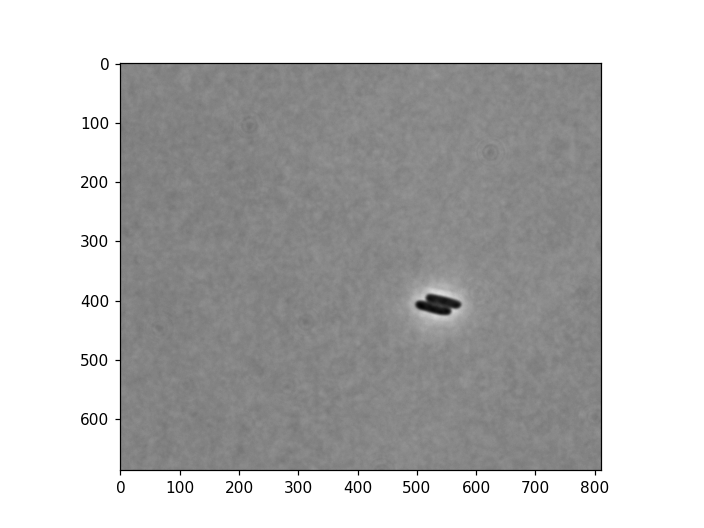

<IPython.core.display.Javascript object>


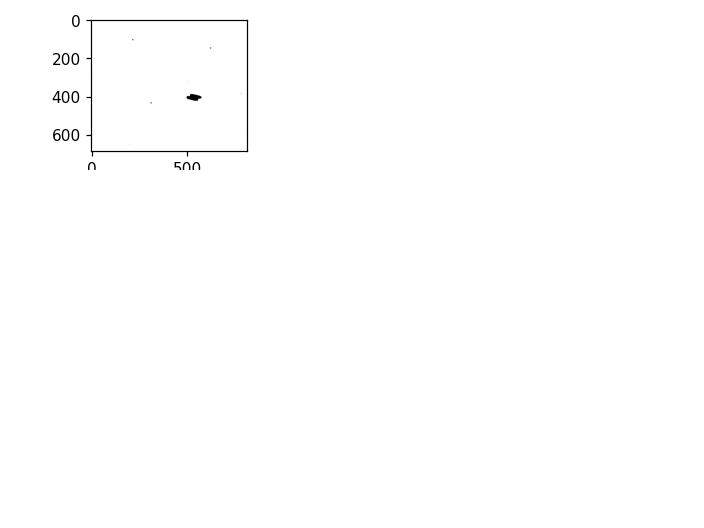

[1 1 1 ... 1 1 1]
dark pixels =  1950


In [5]:
frame_key = 2
image = tifffile.imread(file[0], key=[frame_key])
print('Tiff file info: '+ str(tiff_file.shape))
fig, ax = plt.subplots()
ax.imshow(image, cmap="gray", vmin=0, vmax=255)

block_size = 301
offset_val = 15
thresh_im = threshold_local(image, block_size, offset= offset_val)
binary_im = 1*(image > thresh_im)

fig, ax2 = plt.subplots()
ax2.imshow(binary_im, cmap="gray")

rav_im = binary_im.ravel()
print(rav_im)
tot_pix = (len(rav_im))
white_pix = np.sum(rav_im)
dark_pix2 = tot_pix - white_pix
print('dark pixels = ', dark_pix2)

Tiff file info: (35, 686, 812)


<IPython.core.display.Javascript object>


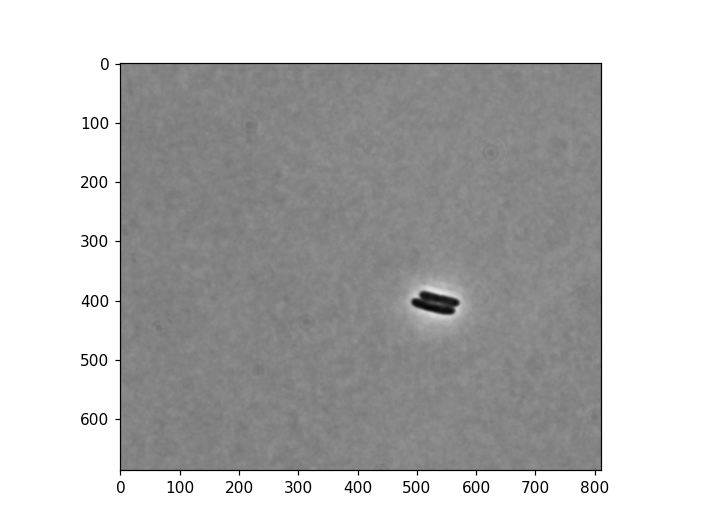

<IPython.core.display.Javascript object>


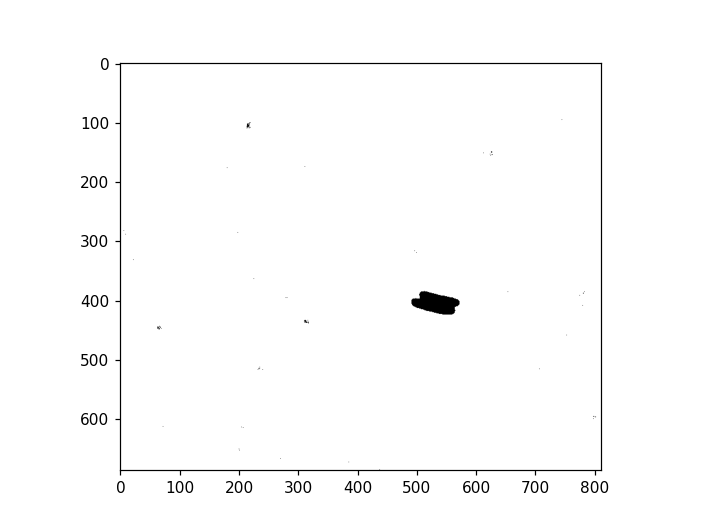

[1 1 1 ... 1 1 1]
dark pixels =  2224


In [6]:
frame_key = 3
image = tifffile.imread(file[0], key=[frame_key])
print('Tiff file info: '+ str(tiff_file.shape))
fig, ax = plt.subplots()
ax.imshow(image, cmap="gray", vmin=0, vmax=255)

block_size = 301
offset_val = 15
thresh_im = threshold_local(image, block_size, offset= offset_val)
binary_im = 1*(image > thresh_im)

fig, ax2 = plt.subplots()
ax2.imshow(binary_im, cmap="gray")

rav_im = binary_im.ravel()
print(rav_im)
tot_pix = (len(rav_im))
white_pix = np.sum(rav_im)
dark_pix3 = tot_pix - white_pix
print('dark pixels = ', dark_pix3)

Tiff file info: (35, 686, 812)


<IPython.core.display.Javascript object>


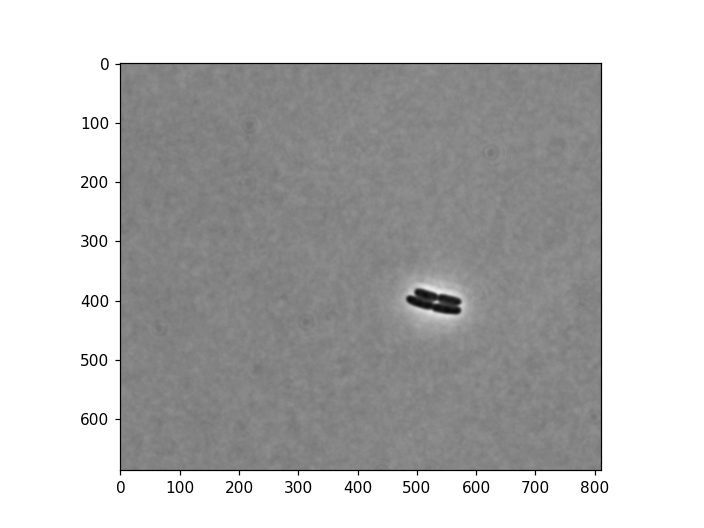

<IPython.core.display.Javascript object>


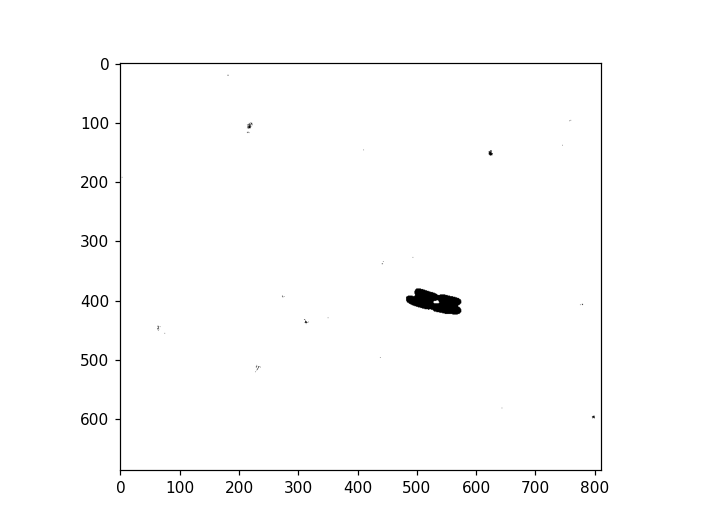

[1 1 1 ... 1 1 1]
dark pixels =  2681


In [7]:
frame_key = 4
image = tifffile.imread(file[0], key=[frame_key])
print('Tiff file info: '+ str(tiff_file.shape))
fig, ax = plt.subplots()
ax.imshow(image, cmap="gray", vmin=0, vmax=255)

block_size = 301
offset_val = 15
thresh_im = threshold_local(image, block_size, offset= offset_val)
binary_im = 1*(image > thresh_im)

fig, ax2 = plt.subplots()
ax2.imshow(binary_im, cmap="gray")

rav_im = binary_im.ravel()
print(rav_im)
tot_pix = (len(rav_im))
white_pix = np.sum(rav_im)
dark_pix4 = tot_pix - white_pix
print('dark pixels = ', dark_pix4)

Tiff file info: (35, 686, 812)


<IPython.core.display.Javascript object>


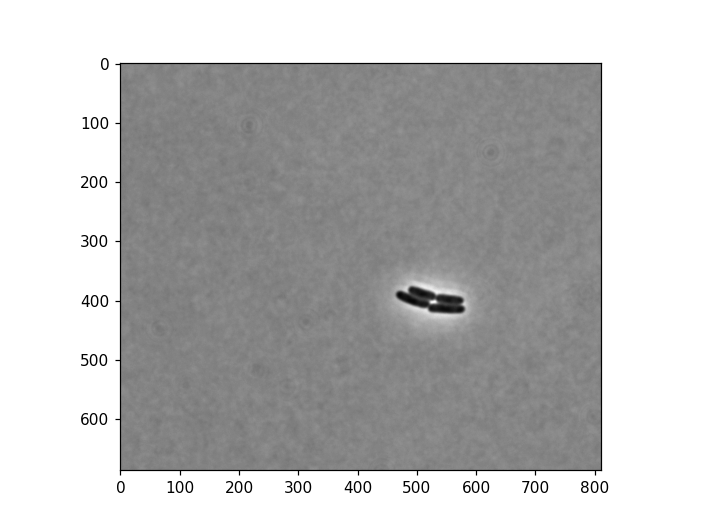

<IPython.core.display.Javascript object>


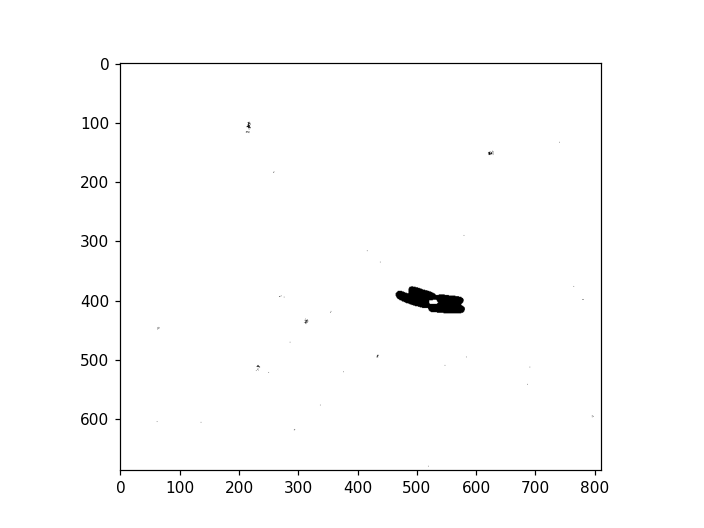

[1 1 1 ... 1 1 1]
dark pixels =  3227


In [8]:
frame_key = 5
image = tifffile.imread(file[0], key=[frame_key])
print('Tiff file info: '+ str(tiff_file.shape))
fig, ax = plt.subplots()
ax.imshow(image, cmap="gray", vmin=0, vmax=255)

block_size = 301
offset_val = 15
thresh_im = threshold_local(image, block_size, offset= offset_val)
binary_im = 1*(image > thresh_im)

fig, ax2 = plt.subplots()
ax2.imshow(binary_im, cmap="gray")

rav_im = binary_im.ravel()
print(rav_im)
tot_pix = (len(rav_im))
white_pix = np.sum(rav_im)
dark_pix5 = tot_pix - white_pix
print('dark pixels = ', dark_pix5)

Tiff file info: (35, 686, 812)


<IPython.core.display.Javascript object>


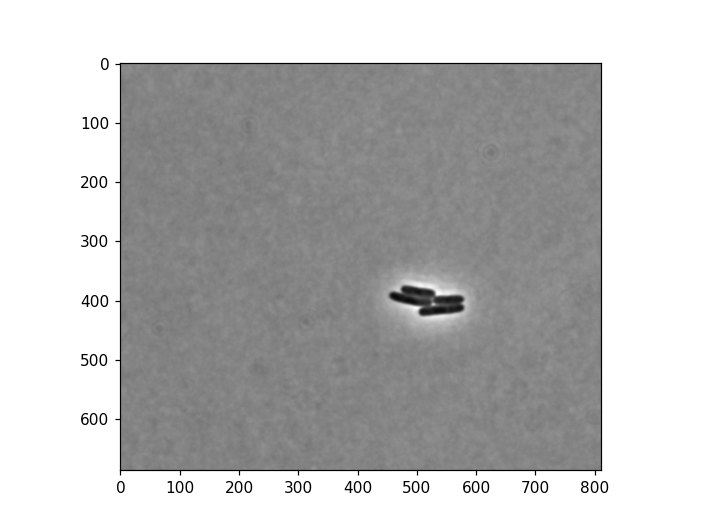

<IPython.core.display.Javascript object>


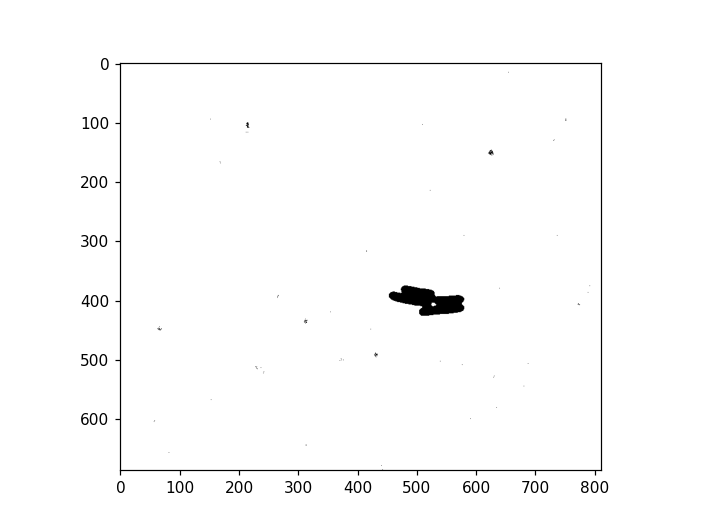

[1 1 1 ... 1 1 1]
dark pixels =  3915


In [9]:
frame_key = 6
image = tifffile.imread(file[0], key=[frame_key])
print('Tiff file info: '+ str(tiff_file.shape))
fig, ax = plt.subplots()
ax.imshow(image, cmap="gray", vmin=0, vmax=255)

block_size = 301
offset_val = 15
thresh_im = threshold_local(image, block_size, offset= offset_val)
binary_im = 1*(image > thresh_im)

fig, ax2 = plt.subplots()
ax2.imshow(binary_im, cmap="gray")

rav_im = binary_im.ravel()
print(rav_im)
tot_pix = (len(rav_im))
white_pix = np.sum(rav_im)
dark_pix6 = tot_pix - white_pix
print('dark pixels = ', dark_pix6)

Tiff file info: (35, 686, 812)


<IPython.core.display.Javascript object>


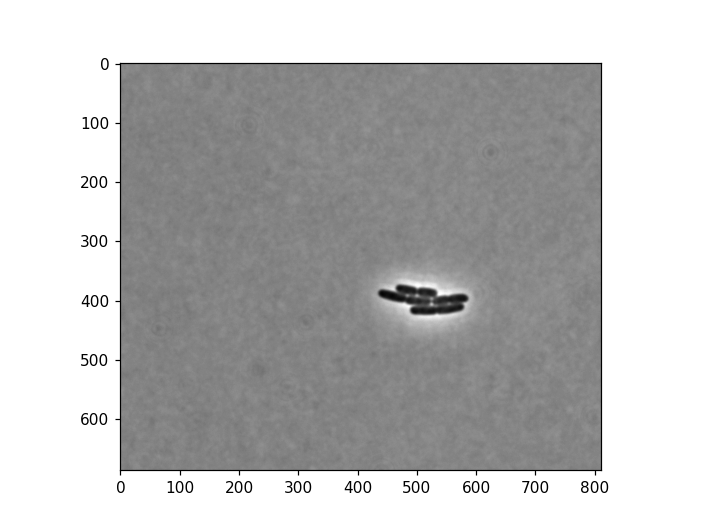

<IPython.core.display.Javascript object>


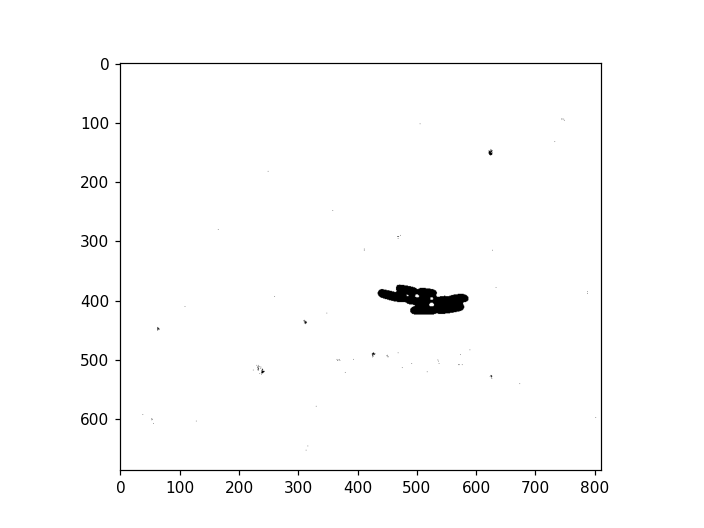

[1 1 1 ... 1 1 1]
dark pixels =  4602


In [10]:
frame_key = 7
image = tifffile.imread(file[0], key=[frame_key])
print('Tiff file info: '+ str(tiff_file.shape))
fig, ax = plt.subplots()
ax.imshow(image, cmap="gray", vmin=0, vmax=255)

block_size = 301
offset_val = 15
thresh_im = threshold_local(image, block_size, offset= offset_val)
binary_im = 1*(image > thresh_im)

fig, ax2 = plt.subplots()
ax2.imshow(binary_im, cmap="gray")

rav_im = binary_im.ravel()
print(rav_im)
tot_pix = (len(rav_im))
white_pix = np.sum(rav_im)
dark_pix7 = tot_pix - white_pix
print('dark pixels = ', dark_pix7)

Tiff file info: (35, 686, 812)


<IPython.core.display.Javascript object>


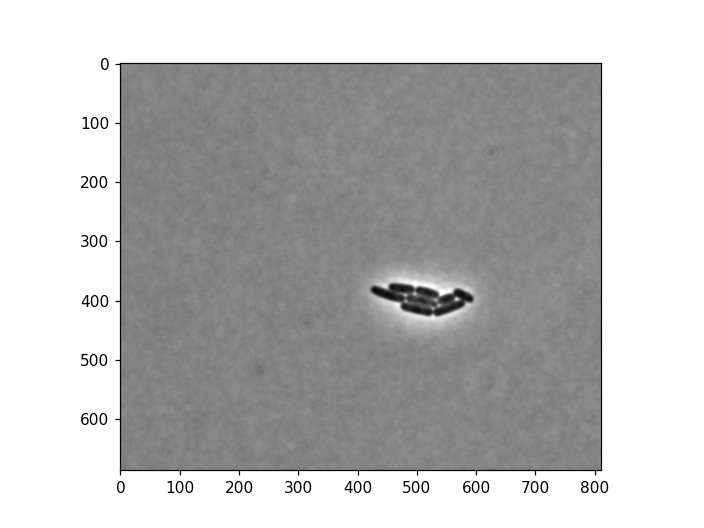

<IPython.core.display.Javascript object>


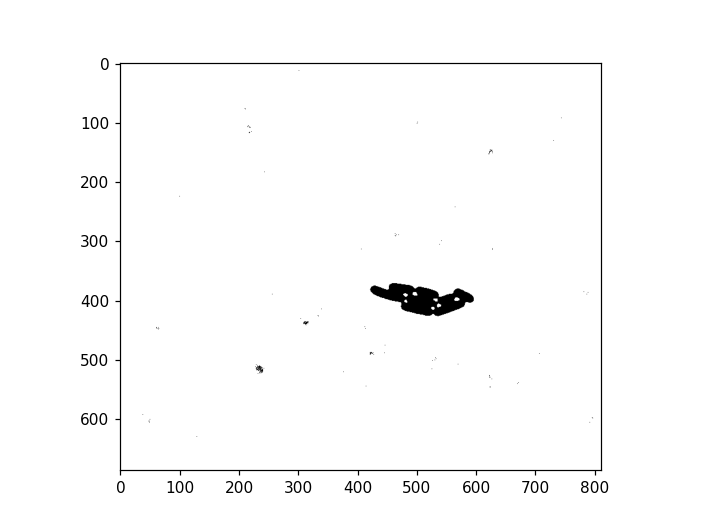

[1 1 1 ... 1 1 1]
dark pixels =  5469


In [11]:
frame_key = 8
image = tifffile.imread(file[0], key=[frame_key])
print('Tiff file info: '+ str(tiff_file.shape))
fig, ax = plt.subplots()
ax.imshow(image, cmap="gray", vmin=0, vmax=255)

block_size = 301
offset_val = 15
thresh_im = threshold_local(image, block_size, offset= offset_val)
binary_im = 1*(image > thresh_im)

fig, ax2 = plt.subplots()
ax2.imshow(binary_im, cmap="gray")

rav_im = binary_im.ravel()
print(rav_im)
tot_pix = (len(rav_im))
white_pix = np.sum(rav_im)
dark_pix8 = tot_pix - white_pix
print('dark pixels = ', dark_pix8)

Tiff file info: (35, 686, 812)


<IPython.core.display.Javascript object>


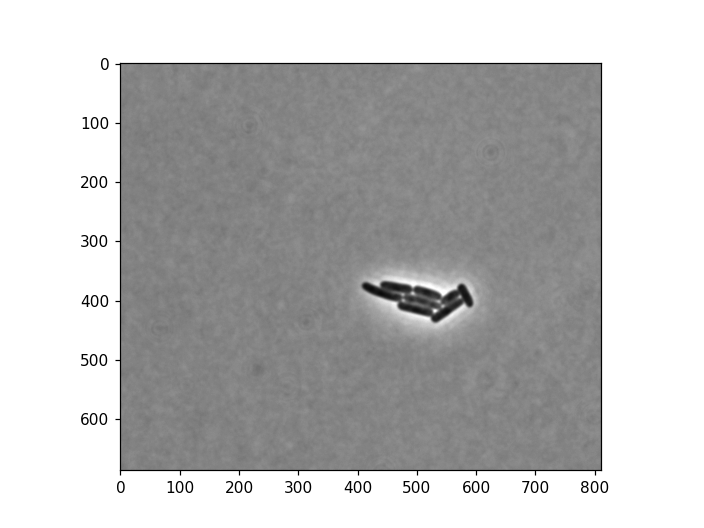

<IPython.core.display.Javascript object>


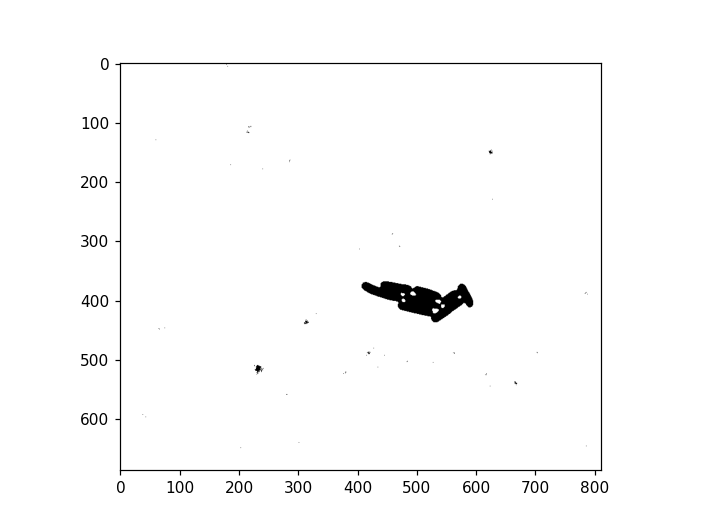

[1 1 1 ... 1 1 1]
dark pixels =  6385


In [12]:
frame_key = 9
image = tifffile.imread(file[0], key=[frame_key])
print('Tiff file info: '+ str(tiff_file.shape))
fig, ax = plt.subplots()
ax.imshow(image, cmap="gray", vmin=0, vmax=255)

block_size = 301
offset_val = 15
thresh_im = threshold_local(image, block_size, offset= offset_val)
binary_im = 1*(image > thresh_im)

fig, ax2 = plt.subplots()
ax2.imshow(binary_im, cmap="gray")

rav_im = binary_im.ravel()
print(rav_im)
tot_pix = (len(rav_im))
white_pix = np.sum(rav_im)
dark_pix9 = tot_pix - white_pix
print('dark pixels = ', dark_pix9)

Tiff file info: (35, 686, 812)


C:\Users\svc-scst291lab\AppData\Local\Temp\ipykernel_8520\2027784502.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


<IPython.core.display.Javascript object>


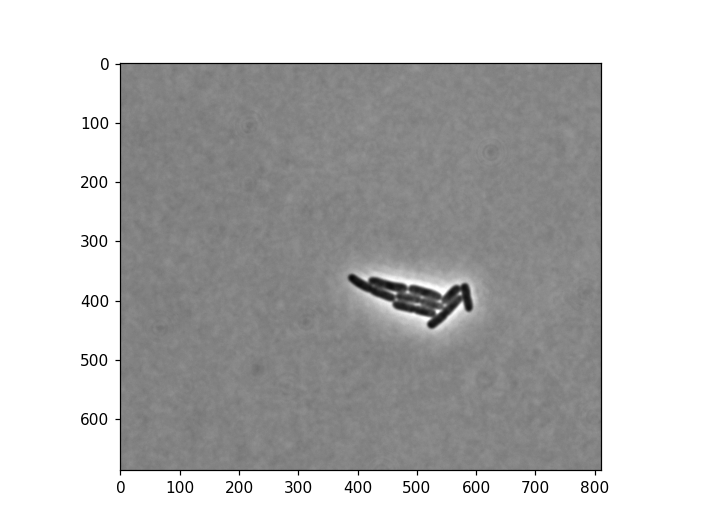

<IPython.core.display.Javascript object>


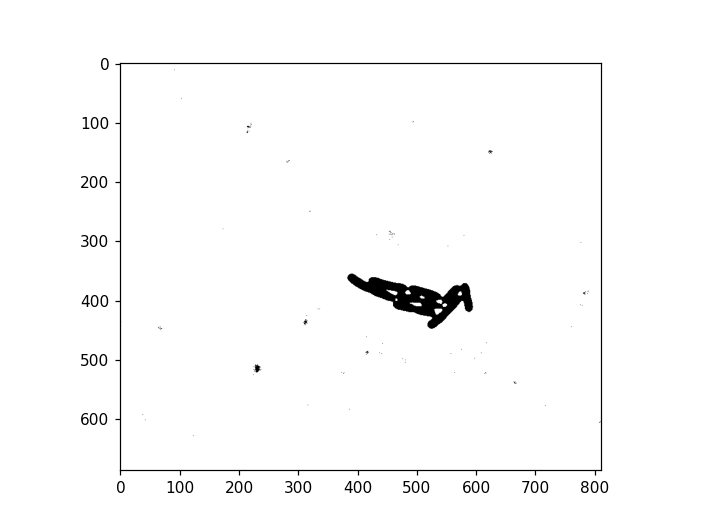

[1 1 1 ... 1 1 1]
dark pixels =  1582


In [13]:
frame_key = 10
image = tifffile.imread(file[0], key=[frame_key])
print('Tiff file info: '+ str(tiff_file.shape))
fig, ax = plt.subplots()
ax.imshow(image, cmap="gray", vmin=0, vmax=255)

block_size = 301
offset_val = 15
thresh_im = threshold_local(image, block_size, offset= offset_val)
binary_im = 1*(image > thresh_im)

fig, ax2 = plt.subplots()
ax2.imshow(binary_im, cmap="gray")

rav_im = binary_im.ravel()
print(rav_im)
tot_pix = (len(rav_im))
white_pix = np.sum(rav_im)
dark_pix10 = tot_pix - white_pix
print('dark pixels = ', dark_pix0)

In [14]:
frame_key = 11
image = tifffile.imread(file[0], key=[frame_key])
print('Tiff file info: '+ str(tiff_file.shape))
fig, ax = plt.subplots()
ax.imshow(image, cmap="gray", vmin=0, vmax=255)

block_size = 301
offset_val = 15
thresh_im = threshold_local(image, block_size, offset= offset_val)
binary_im = 1*(image > thresh_im)

fig, ax2 = plt.subplots()
ax2.imshow(binary_im, cmap="gray")

rav_im = binary_im.ravel()
print(rav_im)
tot_pix = (len(rav_im))
white_pix = np.sum(rav_im)
dark_pix11 = tot_pix - white_pix
print('dark pixels = ', dark_pix11)

Tiff file info: (35, 686, 812)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

[1 1 1 ... 1 1 1]
dark pixels =  8859


In [15]:
frame_key = 12
image = tifffile.imread(file[0], key=[frame_key])
print('Tiff file info: '+ str(tiff_file.shape))
fig, ax = plt.subplots()
ax.imshow(image, cmap="gray", vmin=0, vmax=255)

block_size = 301
offset_val = 15
thresh_im = threshold_local(image, block_size, offset= offset_val)
binary_im = 1*(image > thresh_im)

fig, ax2 = plt.subplots()
ax2.imshow(binary_im, cmap="gray")

rav_im = binary_im.ravel()
print(rav_im)
tot_pix = (len(rav_im))
white_pix = np.sum(rav_im)
dark_pix12 = tot_pix - white_pix
print('dark pixels = ', dark_pix12)

Tiff file info: (35, 686, 812)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

[1 1 1 ... 1 1 1]
dark pixels =  10280


In [16]:
frame_key = 13
image = tifffile.imread(file[0], key=[frame_key])
print('Tiff file info: '+ str(tiff_file.shape))
fig, ax = plt.subplots()
ax.imshow(image, cmap="gray", vmin=0, vmax=255)

block_size = 301
offset_val = 15
thresh_im = threshold_local(image, block_size, offset= offset_val)
binary_im = 1*(image > thresh_im)

fig, ax2 = plt.subplots()
ax2.imshow(binary_im, cmap="gray")

rav_im = binary_im.ravel()
print(rav_im)
tot_pix = (len(rav_im))
white_pix = np.sum(rav_im)
dark_pix13 = tot_pix - white_pix
print('dark pixels = ', dark_pix13)

Tiff file info: (35, 686, 812)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

[1 1 1 ... 1 1 1]
dark pixels =  11619


In [17]:
frame_key = 14
image = tifffile.imread(file[0], key=[frame_key])
print('Tiff file info: '+ str(tiff_file.shape))
fig, ax = plt.subplots()
ax.imshow(image, cmap="gray", vmin=0, vmax=255)

block_size = 301
offset_val = 15
thresh_im = threshold_local(image, block_size, offset= offset_val)
binary_im = 1*(image > thresh_im)

fig, ax2 = plt.subplots()
ax2.imshow(binary_im, cmap="gray")

rav_im = binary_im.ravel()
print(rav_im)
tot_pix = (len(rav_im))
white_pix = np.sum(rav_im)
dark_pix14 = tot_pix - white_pix
print('dark pixels = ', dark_pix14)

Tiff file info: (35, 686, 812)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

[1 1 1 ... 1 1 1]
dark pixels =  12956


Tiff file info: (35, 686, 812)


<IPython.core.display.Javascript object>


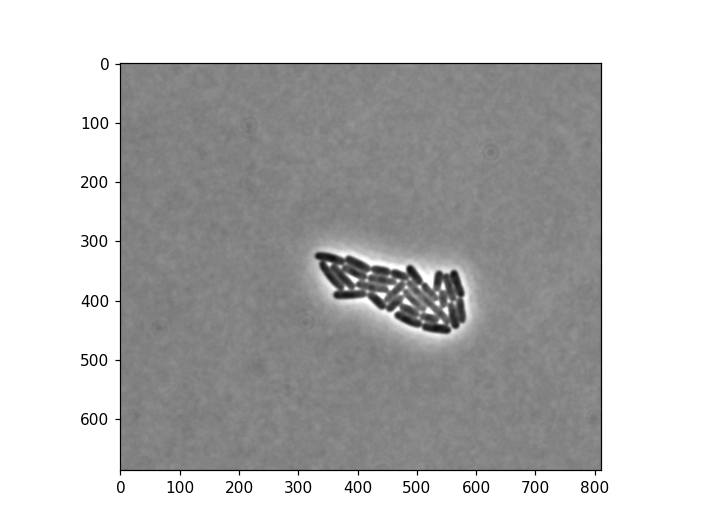

<IPython.core.display.Javascript object>


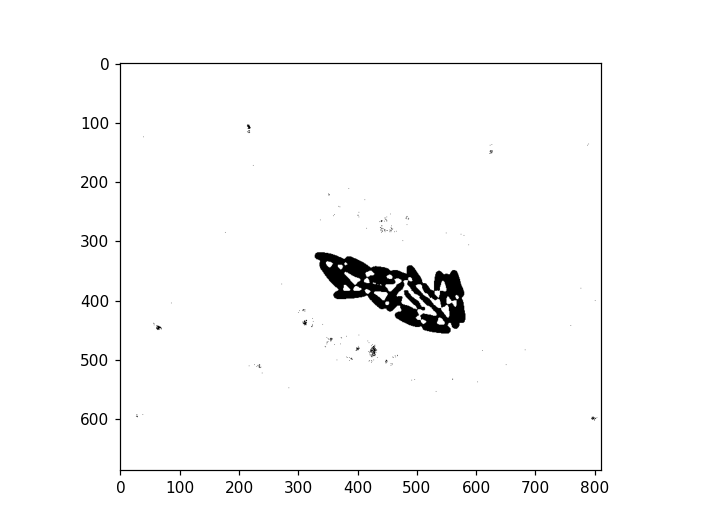

[1 1 1 ... 1 1 1]
dark pixels =  14950


In [18]:
frame_key = 15
image = tifffile.imread(file[0], key=[frame_key])
print('Tiff file info: '+ str(tiff_file.shape))
fig, ax = plt.subplots()
ax.imshow(image, cmap="gray", vmin=0, vmax=255)

block_size = 301
offset_val = 15
thresh_im = threshold_local(image, block_size, offset= offset_val)
binary_im = 1*(image > thresh_im)

fig, ax2 = plt.subplots()
ax2.imshow(binary_im, cmap="gray")

rav_im = binary_im.ravel()
print(rav_im)
tot_pix = (len(rav_im))
white_pix = np.sum(rav_im)
dark_pix15 = tot_pix - white_pix
print('dark pixels = ', dark_pix15)

Tiff file info: (35, 686, 812)


<IPython.core.display.Javascript object>


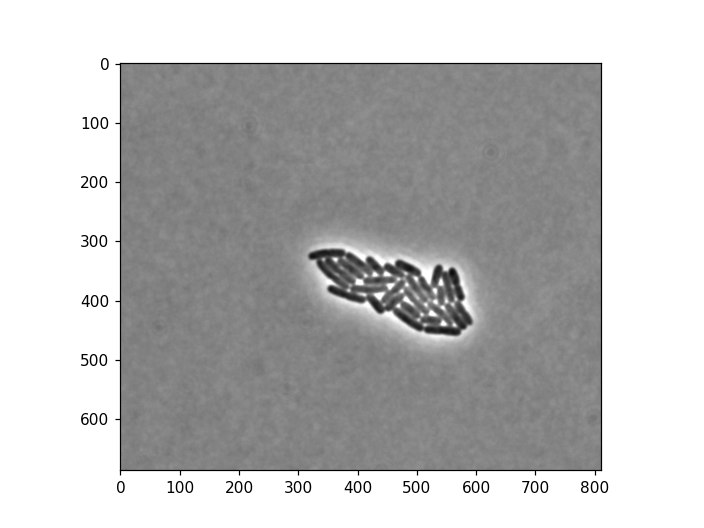

<IPython.core.display.Javascript object>


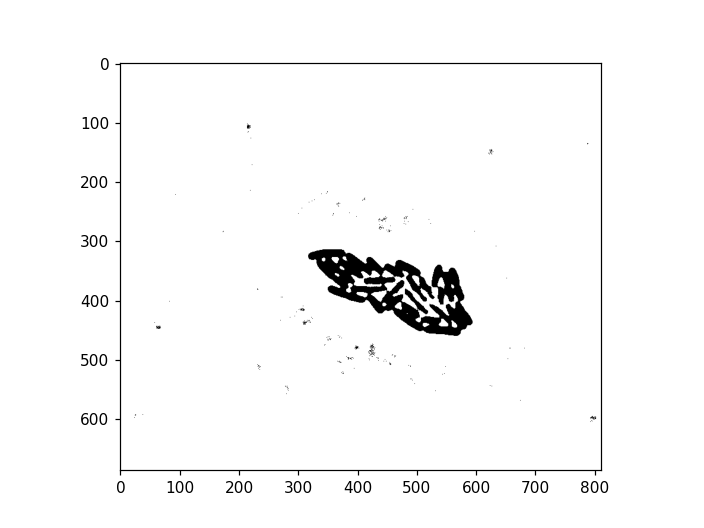

[1 1 1 ... 1 1 1]
dark pixels =  16765


In [19]:
frame_key = 16
image = tifffile.imread(file[0], key=[frame_key])
print('Tiff file info: '+ str(tiff_file.shape))
fig, ax = plt.subplots()
ax.imshow(image, cmap="gray", vmin=0, vmax=255)

block_size = 301
offset_val = 15
thresh_im = threshold_local(image, block_size, offset= offset_val)
binary_im = 1*(image > thresh_im)

fig, ax2 = plt.subplots()
ax2.imshow(binary_im, cmap="gray")

rav_im = binary_im.ravel()
print(rav_im)
tot_pix = (len(rav_im))
white_pix = np.sum(rav_im)
dark_pix16 = tot_pix - white_pix
print('dark pixels = ', dark_pix16)

Tiff file info: (35, 686, 812)


<IPython.core.display.Javascript object>


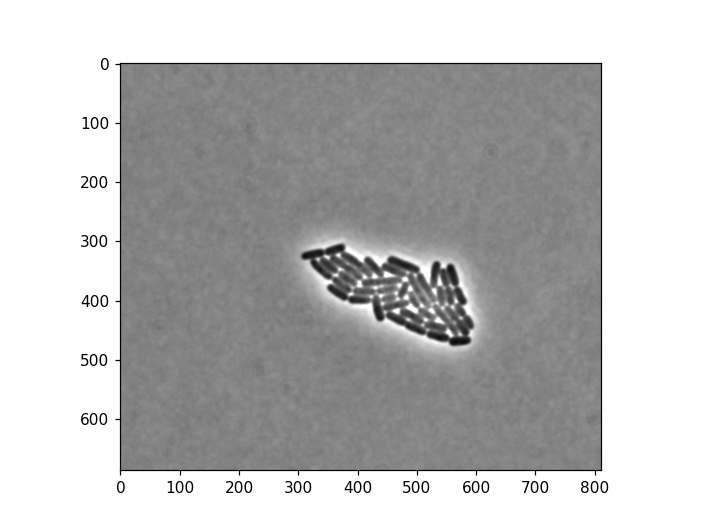

<IPython.core.display.Javascript object>


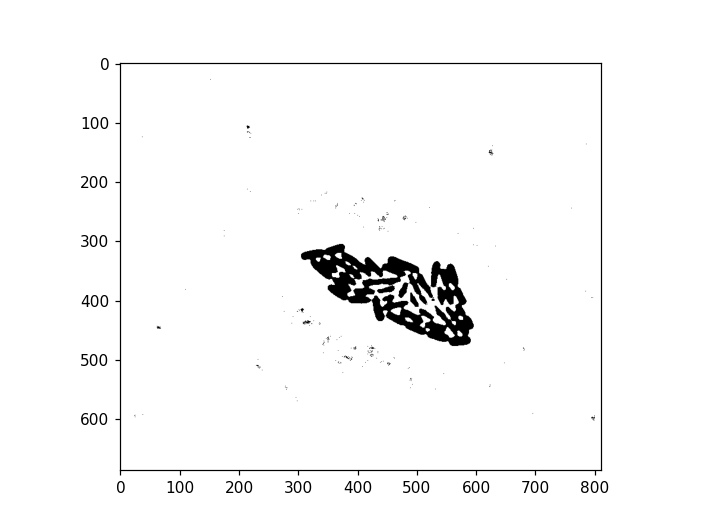

[1 1 1 ... 1 1 1]
dark pixels =  18697


In [20]:
frame_key = 17
image = tifffile.imread(file[0], key=[frame_key])
print('Tiff file info: '+ str(tiff_file.shape))
fig, ax = plt.subplots()
ax.imshow(image, cmap="gray", vmin=0, vmax=255)

block_size = 301
offset_val = 15
thresh_im = threshold_local(image, block_size, offset= offset_val)
binary_im = 1*(image > thresh_im)

fig, ax2 = plt.subplots()
ax2.imshow(binary_im, cmap="gray")

rav_im = binary_im.ravel()
print(rav_im)
tot_pix = (len(rav_im))
white_pix = np.sum(rav_im)
dark_pix17 = tot_pix - white_pix
print('dark pixels = ', dark_pix17)

Tiff file info: (35, 686, 812)


<IPython.core.display.Javascript object>


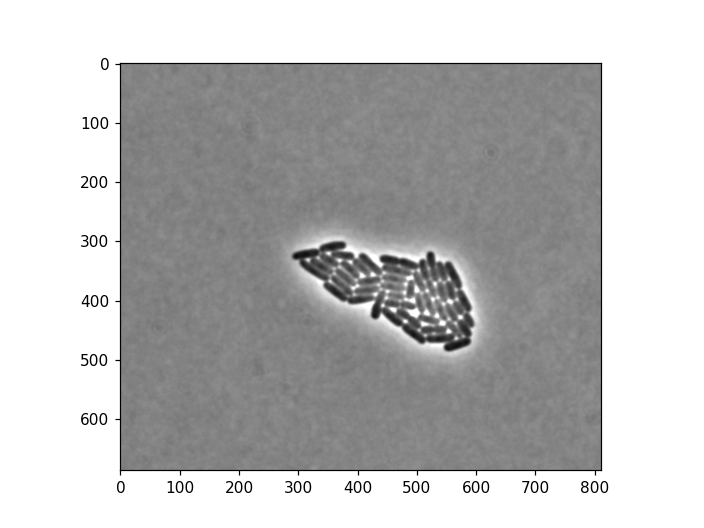

<IPython.core.display.Javascript object>


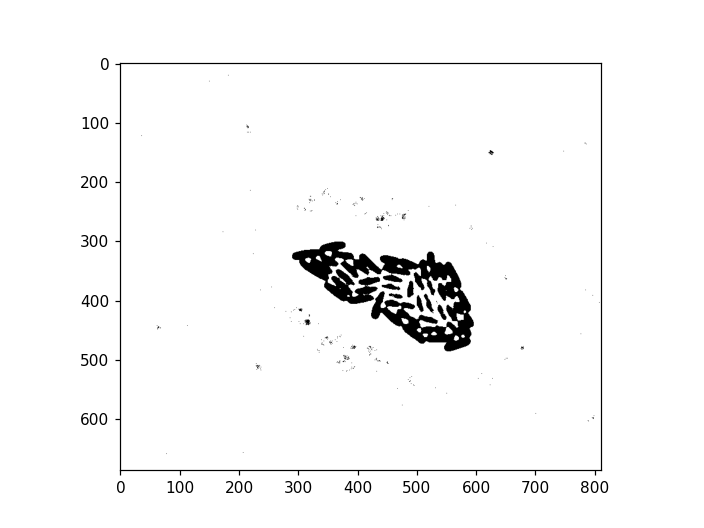

[1 1 1 ... 1 1 1]
dark pixels =  20793


In [21]:
frame_key = 18
image = tifffile.imread(file[0], key=[frame_key])
print('Tiff file info: '+ str(tiff_file.shape))
fig, ax = plt.subplots()
ax.imshow(image, cmap="gray", vmin=0, vmax=255)

block_size = 301
offset_val = 15
thresh_im = threshold_local(image, block_size, offset= offset_val)
binary_im = 1*(image > thresh_im)

fig, ax2 = plt.subplots()
ax2.imshow(binary_im, cmap="gray")

rav_im = binary_im.ravel()
print(rav_im)
tot_pix = (len(rav_im))
white_pix = np.sum(rav_im)
dark_pix18 = tot_pix - white_pix
print('dark pixels = ', dark_pix18)

In [22]:
frame_key = 19
image = tifffile.imread(file[0], key=[frame_key])
print('Tiff file info: '+ str(tiff_file.shape))
fig, ax = plt.subplots()
ax.imshow(image, cmap="gray", vmin=0, vmax=255)

block_size = 301
offset_val = 15
thresh_im = threshold_local(image, block_size, offset= offset_val)
binary_im = 1*(image > thresh_im)

fig, ax2 = plt.subplots()
ax2.imshow(binary_im, cmap="gray")

rav_im = binary_im.ravel()
print(rav_im)
tot_pix = (len(rav_im))
white_pix = np.sum(rav_im)
dark_pix19 = tot_pix - white_pix
print('dark pixels = ', dark_pix19)

Tiff file info: (35, 686, 812)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

[1 1 1 ... 1 1 1]
dark pixels =  23189


In [23]:
frame_key = 20
image = tifffile.imread(file[0], key=[frame_key])
print('Tiff file info: '+ str(tiff_file.shape))
fig, ax = plt.subplots()
ax.imshow(image, cmap="gray", vmin=0, vmax=255)

block_size = 301
offset_val = 15
thresh_im = threshold_local(image, block_size, offset= offset_val)
binary_im = 1*(image > thresh_im)

fig, ax2 = plt.subplots()
ax2.imshow(binary_im, cmap="gray")

rav_im = binary_im.ravel()
print(rav_im)
tot_pix = (len(rav_im))
white_pix = np.sum(rav_im)
dark_pix20 = tot_pix - white_pix
print('dark pixels = ', dark_pix20)

Tiff file info: (35, 686, 812)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

[1 1 1 ... 1 1 1]
dark pixels =  26195


In [24]:
frame_key = 21
image = tifffile.imread(file[0], key=[frame_key])
print('Tiff file info: '+ str(tiff_file.shape))
fig, ax = plt.subplots()
ax.imshow(image, cmap="gray", vmin=0, vmax=255)

block_size = 301
offset_val = 15
thresh_im = threshold_local(image, block_size, offset= offset_val)
binary_im = 1*(image > thresh_im)

fig, ax2 = plt.subplots()
ax2.imshow(binary_im, cmap="gray")

rav_im = binary_im.ravel()
print(rav_im)
tot_pix = (len(rav_im))
white_pix = np.sum(rav_im)
dark_pix21 = tot_pix - white_pix
print('dark pixels = ', dark_pix21)

Tiff file info: (35, 686, 812)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

[1 1 1 ... 1 1 1]
dark pixels =  29842


In [25]:
frame_key = 22
image = tifffile.imread(file[0], key=[frame_key])
print('Tiff file info: '+ str(tiff_file.shape))
fig, ax = plt.subplots()
ax.imshow(image, cmap="gray", vmin=0, vmax=255)

block_size = 301
offset_val = 15
thresh_im = threshold_local(image, block_size, offset= offset_val)
binary_im = 1*(image > thresh_im)

fig, ax2 = plt.subplots()
ax2.imshow(binary_im, cmap="gray")

rav_im = binary_im.ravel()
print(rav_im)
tot_pix = (len(rav_im))
white_pix = np.sum(rav_im)
dark_pix22 = tot_pix - white_pix
print('dark pixels = ', dark_pix22)

Tiff file info: (35, 686, 812)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

[1 1 1 ... 1 1 1]
dark pixels =  34019


Tiff file info: (35, 686, 812)


<IPython.core.display.Javascript object>


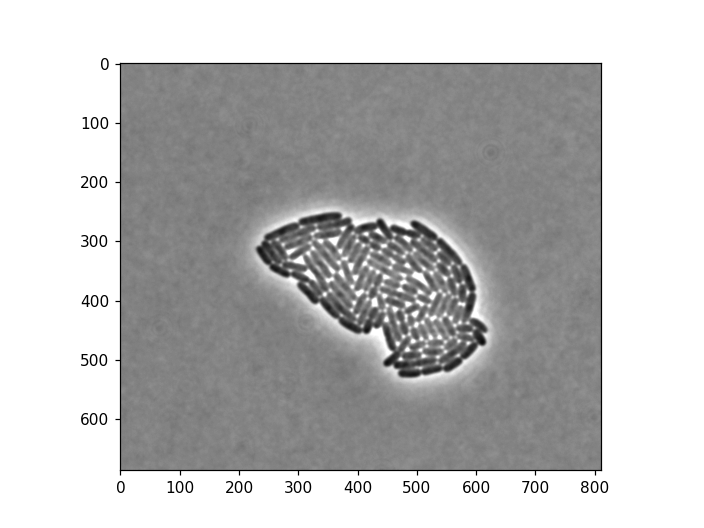

<IPython.core.display.Javascript object>


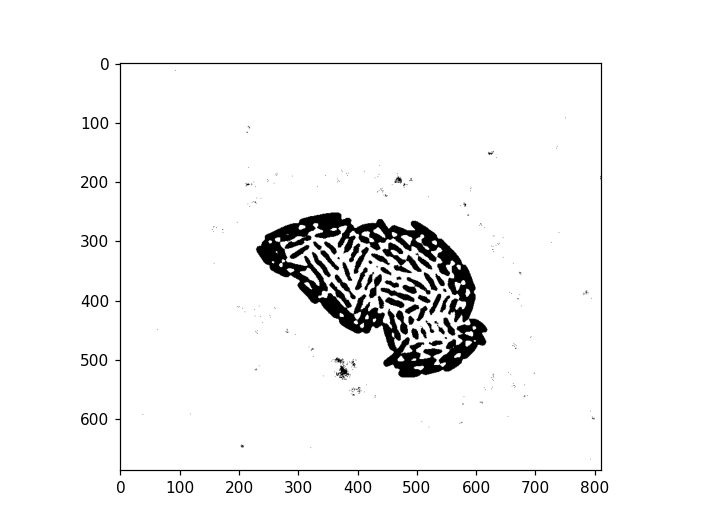

[1 1 1 ... 1 1 1]
dark pixels =  38951


In [26]:
frame_key = 23
image = tifffile.imread(file[0], key=[frame_key])
print('Tiff file info: '+ str(tiff_file.shape))
fig, ax = plt.subplots()
ax.imshow(image, cmap="gray", vmin=0, vmax=255)

block_size = 301
offset_val = 15
thresh_im = threshold_local(image, block_size, offset= offset_val)
binary_im = 1*(image > thresh_im)

fig, ax2 = plt.subplots()
ax2.imshow(binary_im, cmap="gray")

rav_im = binary_im.ravel()
print(rav_im)
tot_pix = (len(rav_im))
white_pix = np.sum(rav_im)
dark_pix23 = tot_pix - white_pix
print('dark pixels = ', dark_pix23)

Tiff file info: (35, 686, 812)


<IPython.core.display.Javascript object>


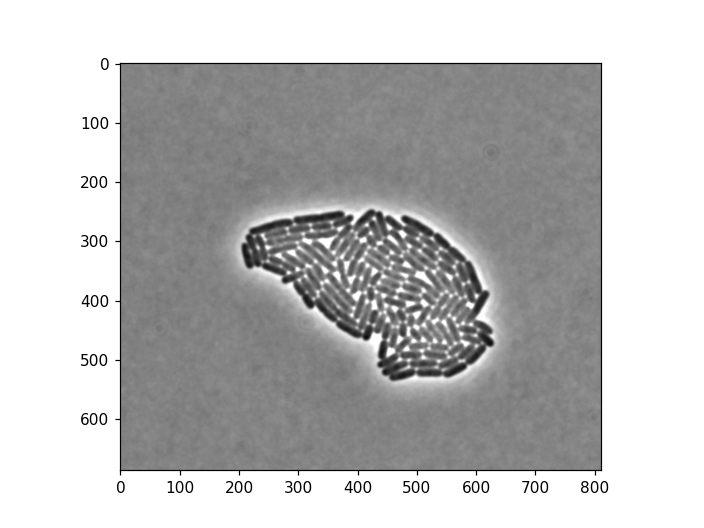

<IPython.core.display.Javascript object>


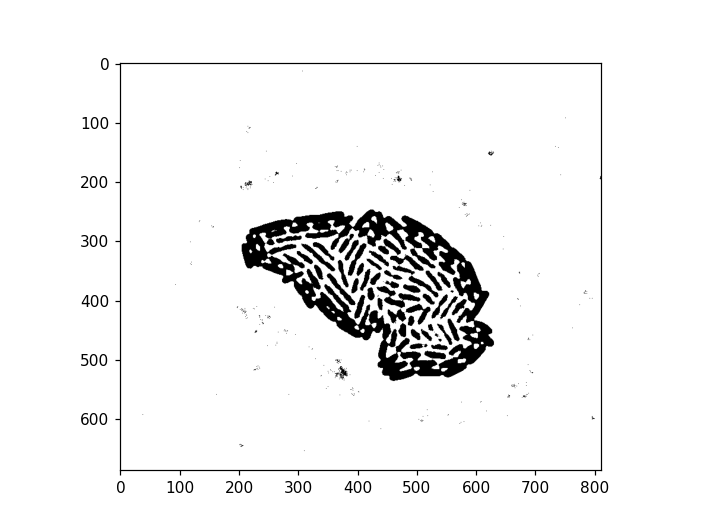

[1 1 1 ... 1 1 1]
dark pixels =  44895


In [27]:
frame_key = 24
image = tifffile.imread(file[0], key=[frame_key])
print('Tiff file info: '+ str(tiff_file.shape))
fig, ax = plt.subplots()
ax.imshow(image, cmap="gray", vmin=0, vmax=255)

block_size = 301
offset_val = 15
thresh_im = threshold_local(image, block_size, offset= offset_val)
binary_im = 1*(image > thresh_im)

fig, ax2 = plt.subplots()
ax2.imshow(binary_im, cmap="gray")

rav_im = binary_im.ravel()
print(rav_im)
tot_pix = (len(rav_im))
white_pix = np.sum(rav_im)
dark_pix24 = tot_pix - white_pix
print('dark pixels = ', dark_pix24)

Tiff file info: (35, 686, 812)


<IPython.core.display.Javascript object>


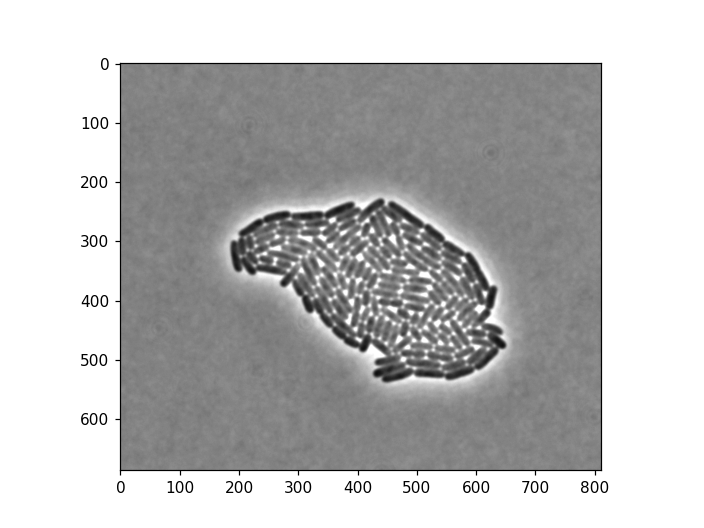

<IPython.core.display.Javascript object>


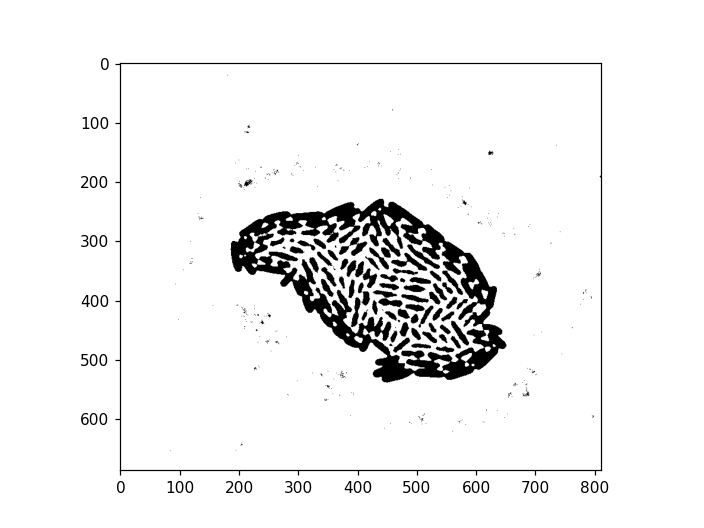

[1 1 1 ... 1 1 1]
dark pixels =  50830


In [28]:
frame_key = 25
image = tifffile.imread(file[0], key=[frame_key])
print('Tiff file info: '+ str(tiff_file.shape))
fig, ax = plt.subplots()
ax.imshow(image, cmap="gray", vmin=0, vmax=255)

block_size = 301
offset_val = 15
thresh_im = threshold_local(image, block_size, offset= offset_val)
binary_im = 1*(image > thresh_im)

fig, ax2 = plt.subplots()
ax2.imshow(binary_im, cmap="gray")

rav_im = binary_im.ravel()
print(rav_im)
tot_pix = (len(rav_im))
white_pix = np.sum(rav_im)
dark_pix25 = tot_pix - white_pix
print('dark pixels = ', dark_pix25)

Tiff file info: (35, 686, 812)


<IPython.core.display.Javascript object>


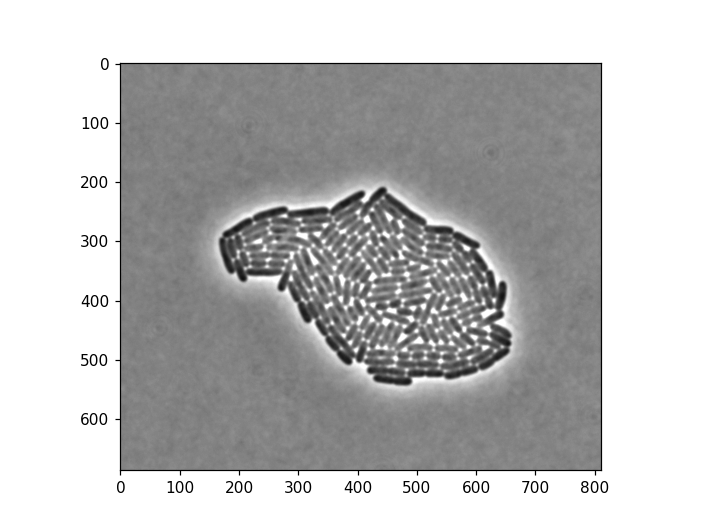

<IPython.core.display.Javascript object>


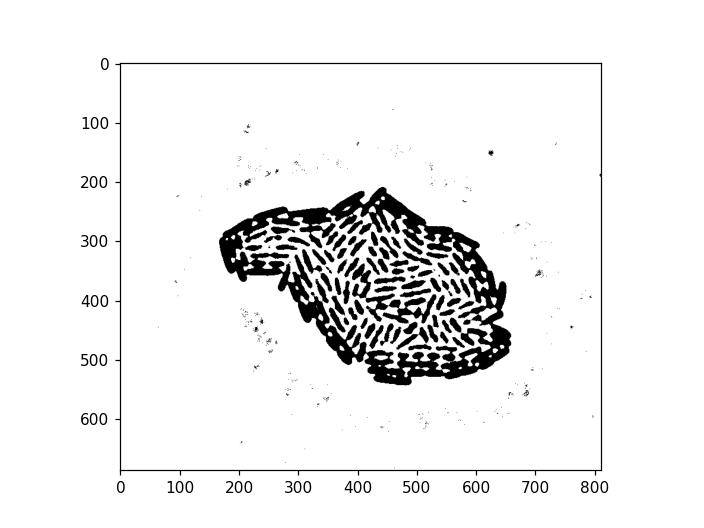

[1 1 1 ... 1 1 1]
dark pixels =  58584


In [29]:
frame_key = 26
image = tifffile.imread(file[0], key=[frame_key])
print('Tiff file info: '+ str(tiff_file.shape))
fig, ax = plt.subplots()
ax.imshow(image, cmap="gray", vmin=0, vmax=255)

block_size = 301
offset_val = 15
thresh_im = threshold_local(image, block_size, offset= offset_val)
binary_im = 1*(image > thresh_im)

fig, ax2 = plt.subplots()
ax2.imshow(binary_im, cmap="gray")

rav_im = binary_im.ravel()
print(rav_im)
tot_pix = (len(rav_im))
white_pix = np.sum(rav_im)
dark_pix26 = tot_pix - white_pix
print('dark pixels = ', dark_pix26)

Tiff file info: (35, 686, 812)


<IPython.core.display.Javascript object>


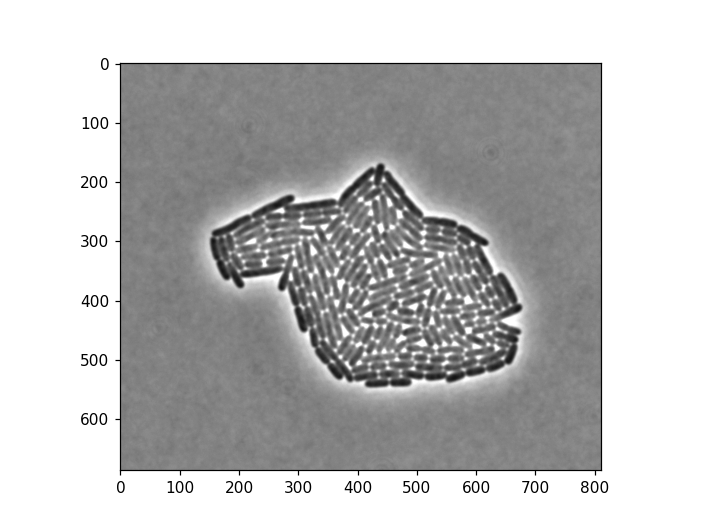

<IPython.core.display.Javascript object>

[1 1 1 ... 1 1 1]
dark pixels =  68126


In [30]:
frame_key = 27
image = tifffile.imread(file[0], key=[frame_key])
print('Tiff file info: '+ str(tiff_file.shape))
fig, ax = plt.subplots()
ax.imshow(image, cmap="gray", vmin=0, vmax=255)

block_size = 301
offset_val = 15
thresh_im = threshold_local(image, block_size, offset= offset_val)
binary_im = 1*(image > thresh_im)

fig, ax2 = plt.subplots()
ax2.imshow(binary_im, cmap="gray")

rav_im = binary_im.ravel()
print(rav_im)
tot_pix = (len(rav_im))
white_pix = np.sum(rav_im)
dark_pix27 = tot_pix - white_pix
print('dark pixels = ', dark_pix27)

In [31]:
frame_key = 28
image = tifffile.imread(file[0], key=[frame_key])
print('Tiff file info: '+ str(tiff_file.shape))
fig, ax = plt.subplots()
ax.imshow(image, cmap="gray", vmin=0, vmax=255)

block_size = 301
offset_val = 15
thresh_im = threshold_local(image, block_size, offset= offset_val)
binary_im = 1*(image > thresh_im)

fig, ax2 = plt.subplots()
ax2.imshow(binary_im, cmap="gray")

rav_im = binary_im.ravel()
print(rav_im)
tot_pix = (len(rav_im))
white_pix = np.sum(rav_im)
dark_pix28 = tot_pix - white_pix
print('dark pixels = ', dark_pix28)

Tiff file info: (35, 686, 812)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

[1 1 1 ... 1 1 1]
dark pixels =  79918


In [32]:
frame_key = 29
image = tifffile.imread(file[0], key=[frame_key])
print('Tiff file info: '+ str(tiff_file.shape))
fig, ax = plt.subplots()
ax.imshow(image, cmap="gray", vmin=0, vmax=255)

block_size = 301
offset_val = 15
thresh_im = threshold_local(image, block_size, offset= offset_val)
binary_im = 1*(image > thresh_im)

fig, ax2 = plt.subplots()
ax2.imshow(binary_im, cmap="gray")

rav_im = binary_im.ravel()
print(rav_im)
tot_pix = (len(rav_im))
white_pix = np.sum(rav_im)
dark_pix29 = tot_pix - white_pix
print('dark pixels = ', dark_pix29)

Tiff file info: (35, 686, 812)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

[1 1 1 ... 1 1 1]
dark pixels =  91397


Tiff file info: (35, 686, 812)


<IPython.core.display.Javascript object>


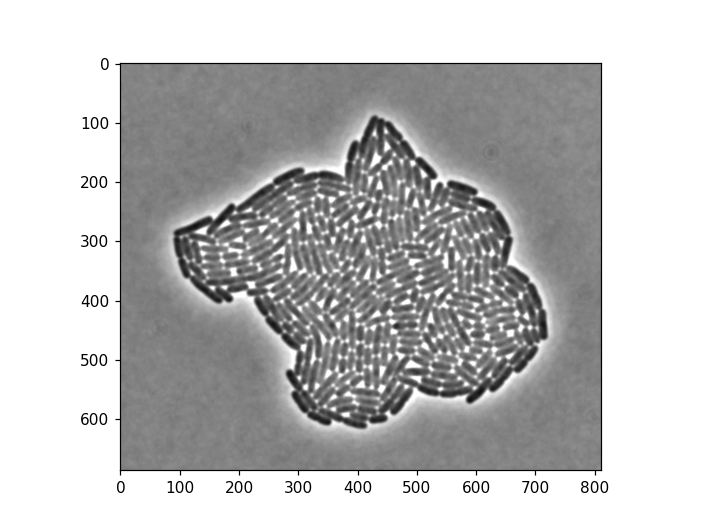

<IPython.core.display.Javascript object>


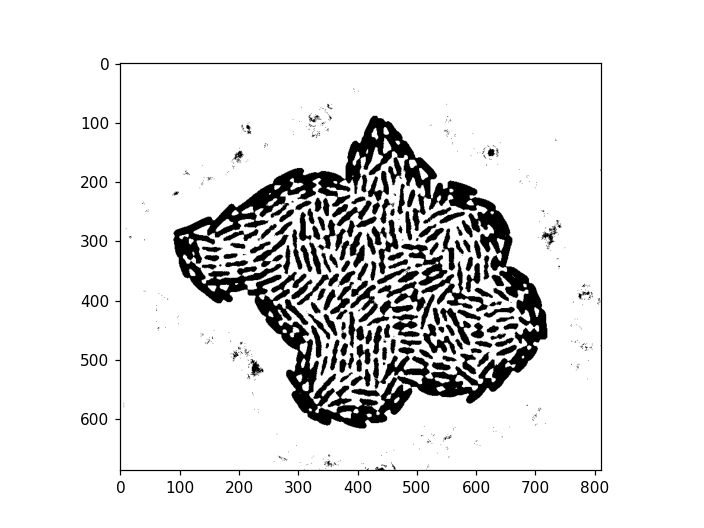

[1 1 1 ... 1 1 1]
dark pixels =  106372


In [33]:
frame_key = 30
image = tifffile.imread(file[0], key=[frame_key])
print('Tiff file info: '+ str(tiff_file.shape))
fig, ax = plt.subplots()
ax.imshow(image, cmap="gray", vmin=0, vmax=255)

block_size = 301
offset_val = 15
thresh_im = threshold_local(image, block_size, offset= offset_val)
binary_im = 1*(image > thresh_im)

fig, ax2 = plt.subplots()
ax2.imshow(binary_im, cmap="gray")

rav_im = binary_im.ravel()
print(rav_im)
tot_pix = (len(rav_im))
white_pix = np.sum(rav_im)
dark_pix30 = tot_pix - white_pix
print('dark pixels = ', dark_pix30)

Tiff file info: (35, 686, 812)


<IPython.core.display.Javascript object>


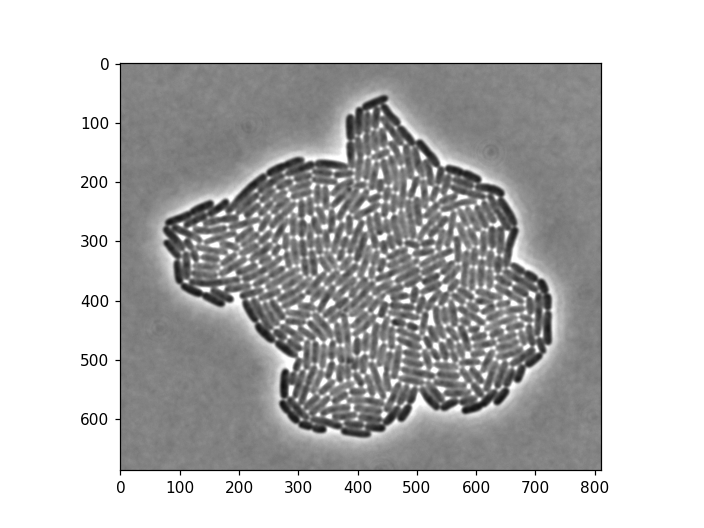

<IPython.core.display.Javascript object>


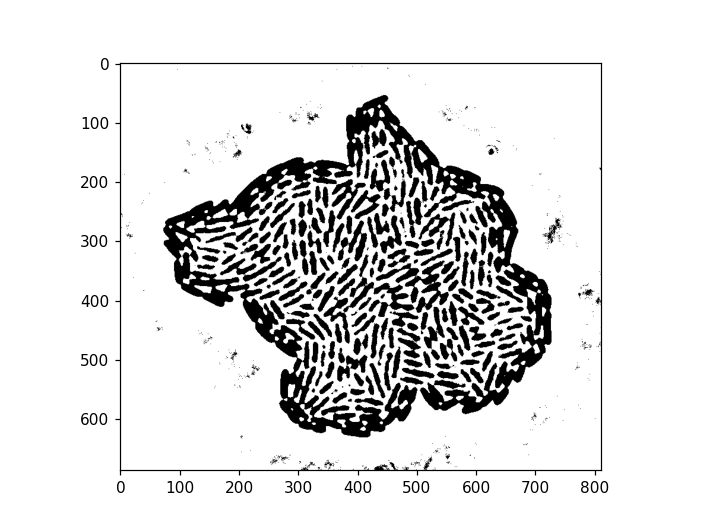

[1 1 1 ... 1 1 1]
dark pixels =  121814


In [34]:
frame_key = 31
image = tifffile.imread(file[0], key=[frame_key])
print('Tiff file info: '+ str(tiff_file.shape))
fig, ax = plt.subplots()
ax.imshow(image, cmap="gray", vmin=0, vmax=255)

block_size = 301
offset_val = 15
thresh_im = threshold_local(image, block_size, offset= offset_val)
binary_im = 1*(image > thresh_im)

fig, ax2 = plt.subplots()
ax2.imshow(binary_im, cmap="gray")

rav_im = binary_im.ravel()
print(rav_im)
tot_pix = (len(rav_im))
white_pix = np.sum(rav_im)
dark_pix31 = tot_pix - white_pix
print('dark pixels = ', dark_pix31)

Tiff file info: (35, 686, 812)


<IPython.core.display.Javascript object>


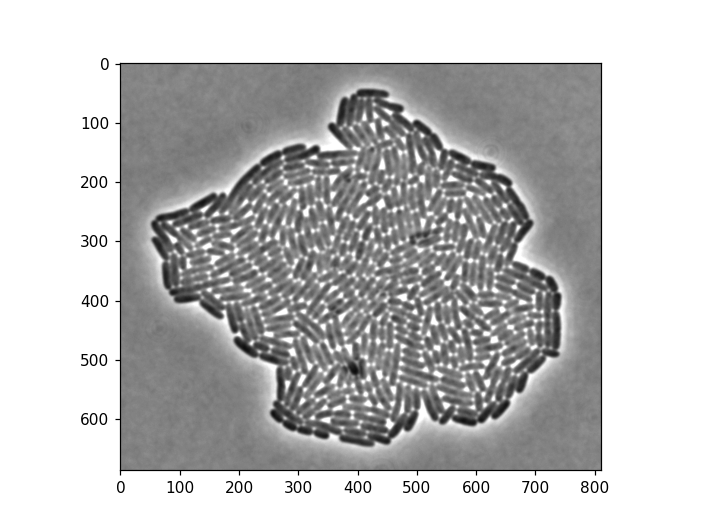

<IPython.core.display.Javascript object>


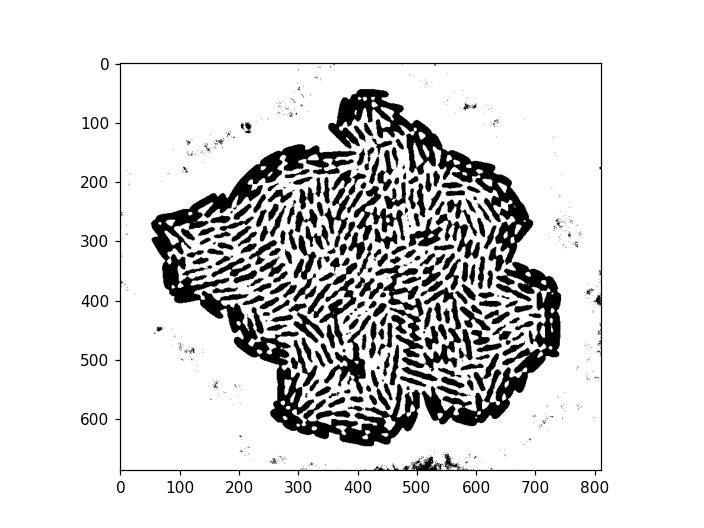

[1 1 1 ... 1 1 1]
dark pixels =  138466


In [35]:
frame_key = 32
image = tifffile.imread(file[0], key=[frame_key])
print('Tiff file info: '+ str(tiff_file.shape))
fig, ax = plt.subplots()
ax.imshow(image, cmap="gray", vmin=0, vmax=255)

block_size = 301
offset_val = 15
thresh_im = threshold_local(image, block_size, offset= offset_val)
binary_im = 1*(image > thresh_im)

fig, ax2 = plt.subplots()
ax2.imshow(binary_im, cmap="gray")

rav_im = binary_im.ravel()
print(rav_im)
tot_pix = (len(rav_im))
white_pix = np.sum(rav_im)
dark_pix32 = tot_pix - white_pix
print('dark pixels = ', dark_pix32)

Tiff file info: (35, 686, 812)


<IPython.core.display.Javascript object>


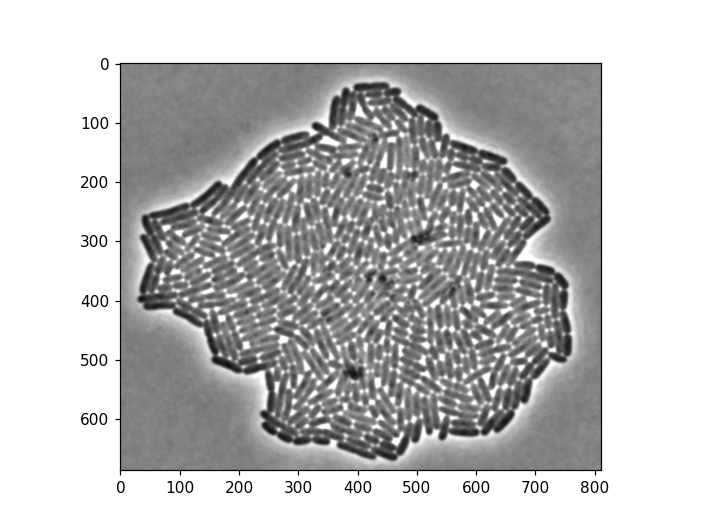

<IPython.core.display.Javascript object>


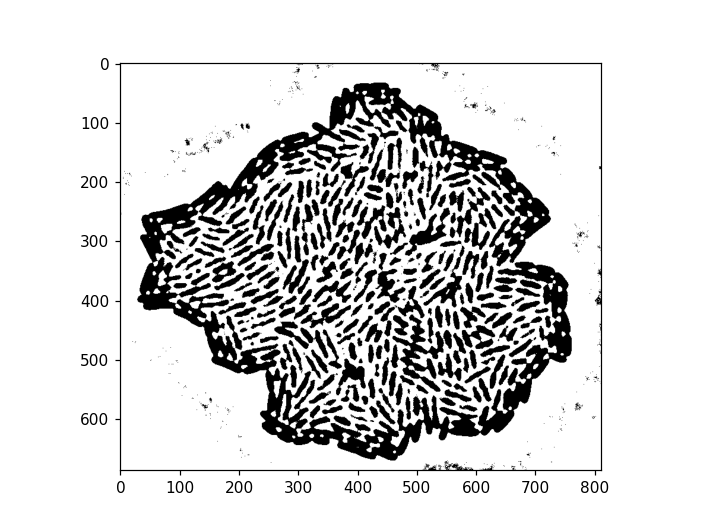

[1 1 1 ... 1 1 1]
dark pixels =  156746


In [36]:
frame_key = 33
image = tifffile.imread(file[0], key=[frame_key])
print('Tiff file info: '+ str(tiff_file.shape))
fig, ax = plt.subplots()
ax.imshow(image, cmap="gray", vmin=0, vmax=255)

block_size = 301
offset_val = 15
thresh_im = threshold_local(image, block_size, offset= offset_val)
binary_im = 1*(image > thresh_im)

fig, ax2 = plt.subplots()
ax2.imshow(binary_im, cmap="gray")

rav_im = binary_im.ravel()
print(rav_im)
tot_pix = (len(rav_im))
white_pix = np.sum(rav_im)
dark_pix33 = tot_pix - white_pix
print('dark pixels = ', dark_pix33)

Tiff file info: (35, 686, 812)


<IPython.core.display.Javascript object>


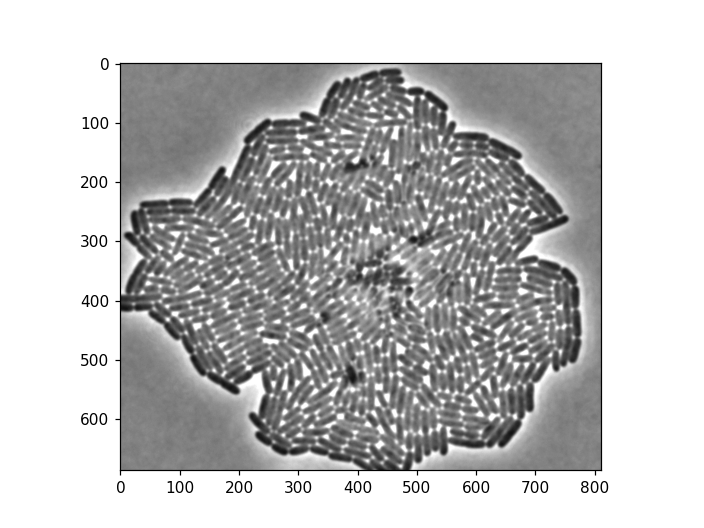

<IPython.core.display.Javascript object>


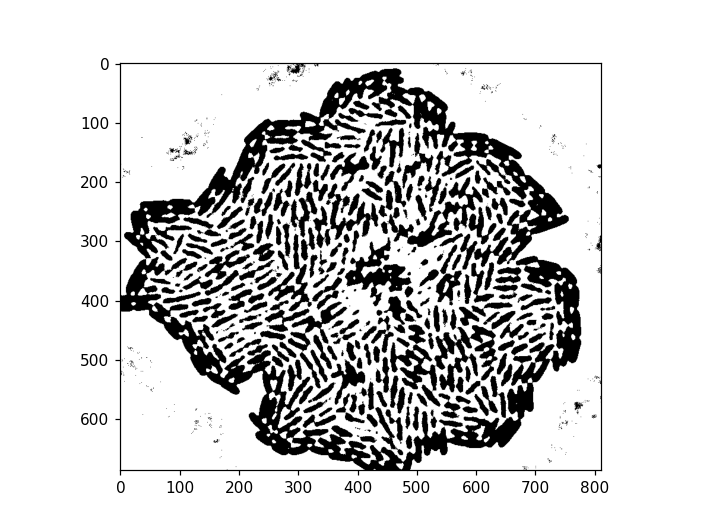

[1 1 1 ... 1 1 1]
dark pixels =  180318


In [37]:
frame_key = 34
image = tifffile.imread(file[0], key=[frame_key])
print('Tiff file info: '+ str(tiff_file.shape))
fig, ax = plt.subplots()
ax.imshow(image, cmap="gray", vmin=0, vmax=255)

block_size = 301
offset_val = 15
thresh_im = threshold_local(image, block_size, offset= offset_val)
binary_im = 1*(image > thresh_im)

fig, ax2 = plt.subplots()
ax2.imshow(binary_im, cmap="gray")

rav_im = binary_im.ravel()
print(rav_im)
tot_pix = (len(rav_im))
white_pix = np.sum(rav_im)
dark_pix34 = tot_pix - white_pix
print('dark pixels = ', dark_pix34)

# Make a list of dark pixel values from each frame
The number of dark pixel values in a frame is the area taken up by bacteria in units of pixels at a given time. This list will describe bacteria growth over time.

In [39]:
dark_area = [dark_pix0, dark_pix1, dark_pix2, dark_pix3, dark_pix4, dark_pix5, dark_pix6, dark_pix7, dark_pix8, dark_pix9, dark_pix10, dark_pix11, dark_pix12, dark_pix13, dark_pix14, dark_pix15, dark_pix16, dark_pix17, dark_pix18, dark_pix19, dark_pix20, dark_pix21, dark_pix22, dark_pix23, dark_pix24, dark_pix25, dark_pix26, dark_pix27, dark_pix28, dark_pix29, dark_pix30, dark_pix31, dark_pix32, dark_pix33, dark_pix34]

# Plot bacteria area vs. time
Each frame was taken 10 minutes apart.

In [40]:
time = np.arange(0,350,10)                 # Make a list of timepoints when images were taken
time

array([  0,  10,  20,  30,  40,  50,  60,  70,  80,  90, 100, 110, 120,
       130, 140, 150, 160, 170, 180, 190, 200, 210, 220, 230, 240, 250,
       260, 270, 280, 290, 300, 310, 320, 330, 340])

<IPython.core.display.Javascript object>


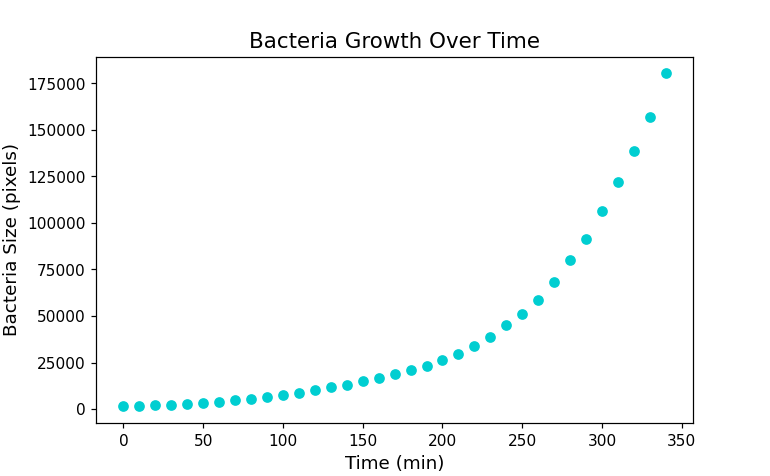

Text(0.5, 1.0, 'Bacteria Growth Over Time')

In [50]:
fig,ax = plt.subplots(figsize=(7,7/1.618))
ax.plot(time, dark_area, 'o', lw=3, color='darkturquoise')
ax.set_xlabel("Time (min)", fontsize=12)
ax.set_ylabel("Bacteria Size (pixels)", fontsize=12)
plt.title("Bacteria Growth Over Time", fontsize=14)

# Compare with theory
Model comes from: ...

In [ ]:
fig,ax = plt.subplots(figsize=(7,7/1.618))
ax.plot(time, dark_area, 'o', lw=3, color='darkturquoise', label='Experimental')
ax.plot(time, _____, '-', lw=2, color='hotpink', label='Theoretical')
ax.set_xlabel("Time (min)", fontsize=12)
ax.set_ylabel("Bacteria Size (pixels)", fontsize=12)
ax.legend(loc = "upper left", fontsize=12)
plt.title("Bacteria Growth Over Time", fontsize=14)